In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('D:\multi_class\BrreakHIS_v1_100x_Binary\dataset'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

D:\multi_class\BrreakHIS_v1_100x_Binary\dataset\benign\SOB_B_A-14-22549AB-100-001.png
D:\multi_class\BrreakHIS_v1_100x_Binary\dataset\benign\SOB_B_A-14-22549AB-100-002.png
D:\multi_class\BrreakHIS_v1_100x_Binary\dataset\benign\SOB_B_A-14-22549AB-100-003.png
D:\multi_class\BrreakHIS_v1_100x_Binary\dataset\benign\SOB_B_A-14-22549AB-100-004.png
D:\multi_class\BrreakHIS_v1_100x_Binary\dataset\benign\SOB_B_A-14-22549AB-100-005.png
D:\multi_class\BrreakHIS_v1_100x_Binary\dataset\benign\SOB_B_A-14-22549AB-100-006.png
D:\multi_class\BrreakHIS_v1_100x_Binary\dataset\benign\SOB_B_A-14-22549AB-100-007.png
D:\multi_class\BrreakHIS_v1_100x_Binary\dataset\benign\SOB_B_A-14-22549AB-100-008.png
D:\multi_class\BrreakHIS_v1_100x_Binary\dataset\benign\SOB_B_A-14-22549AB-100-009.png
D:\multi_class\BrreakHIS_v1_100x_Binary\dataset\benign\SOB_B_A-14-22549AB-100-010.png
D:\multi_class\BrreakHIS_v1_100x_Binary\dataset\benign\SOB_B_A-14-22549AB-100-011.png
D:\multi_class\BrreakHIS_v1_100x_Binary\dataset\benign

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
base_dir = 'D:\multi_class\BrreakHIS_v1_100x_Binary\dataset'
print(os.listdir(base_dir))

# Matplotlib for visualization
import matplotlib.pyplot as plt
plt.style.use("ggplot")

# OpenCV Image Library
import cv2

# Import PyTorch
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, Dataset
import torchvision
import torch.optim as optim

# Import useful sklearn functions
import sklearn
from sklearn.metrics import roc_auc_score, accuracy_score
from PIL import Image

['benign', 'malignant']


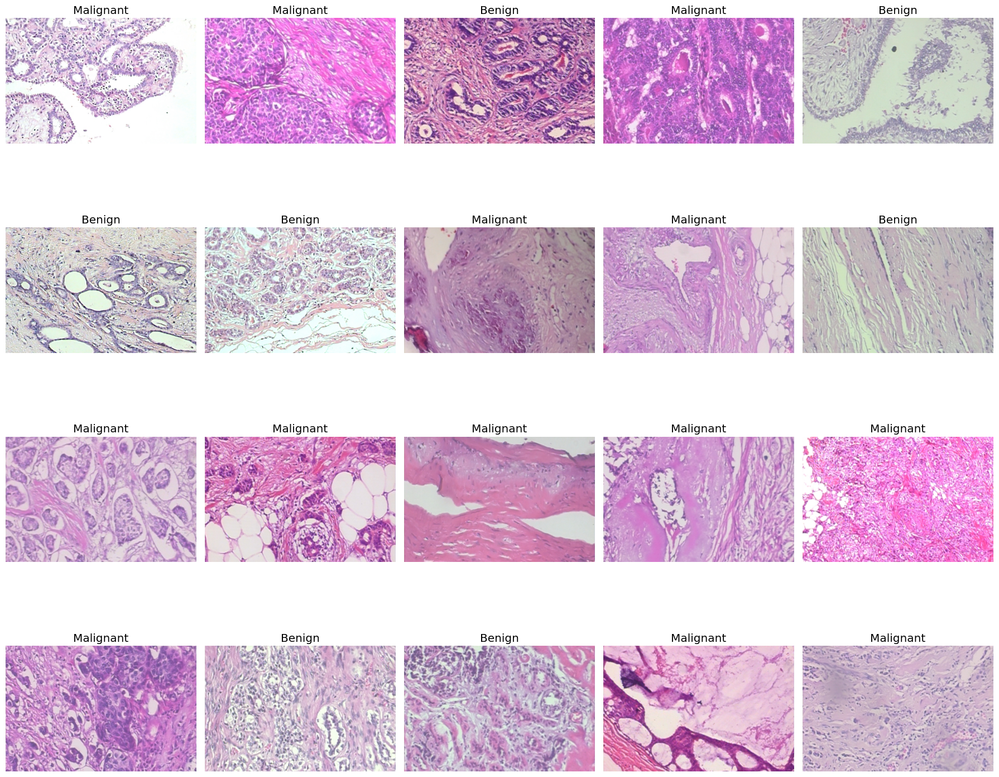

In [3]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Directory containing images
base_dir = 'D:/multi_class/BrreakHIS_v1_100x_Binary/dataset'

# Function to map folder names to binary classes
def map_to_binary_class(folder_name):
    folder_name = folder_name.lower()  # Ensure case insensitivity
    if 'benign' in folder_name:        # Top-level folder contains 'benign'
        return 'Benign'
    elif 'malignant' in folder_name:   # Top-level folder contains 'malignant'
        return 'Malignant'
    else:
        return 'Unknown'

# Function to display random images from a directory with binary classification
def show_random_images_from_directory(directory, num_images=10):
    # List all files in the directory
    image_files = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith('.png') or file.endswith('.jpg') or file.endswith('.jpeg'):
                img_path = os.path.join(root, file)
                image_files.append(img_path)
    
    # Randomly select num_images images
    random_images = random.sample(image_files, num_images)
    
    # Create subplots
    ncols = 5  # Number of columns for display
    nrows = (num_images + ncols - 1) // ncols  # Calculate number of rows based on number of images
    fig, axes = plt.subplots(nrows, ncols, figsize=(18, 4 * nrows))

    for i, img_path in enumerate(random_images):
        ax = axes.flatten()[i]
        image = Image.open(img_path)
        ax.imshow(image)

        # Extract class name from the image path and map it to binary class
        folder_name = os.path.basename(os.path.dirname(img_path))  # Get parent folder
        binary_class = map_to_binary_class(folder_name)
        ax.set_title(binary_class)
        ax.axis('off')
    
    # Remove empty subplots
    for j in range(i + 1, nrows * ncols):
        axes.flatten()[j].remove()
    
    plt.tight_layout()
    plt.show()

# Display random images from the dataset directory with binary classification
show_random_images_from_directory(base_dir, num_images=20)


Found 2015 images in directory: D:/multi_class/BrreakHIS_v1_100x_Binary/dataset
Sample of image paths:
D:/multi_class/BrreakHIS_v1_100x_Binary/dataset\benign\SOB_B_A-14-22549AB-100-001.png
D:/multi_class/BrreakHIS_v1_100x_Binary/dataset\benign\SOB_B_A-14-22549AB-100-002.png
D:/multi_class/BrreakHIS_v1_100x_Binary/dataset\benign\SOB_B_A-14-22549AB-100-003.png
D:/multi_class/BrreakHIS_v1_100x_Binary/dataset\benign\SOB_B_A-14-22549AB-100-004.png
D:/multi_class/BrreakHIS_v1_100x_Binary/dataset\benign\SOB_B_A-14-22549AB-100-005.png


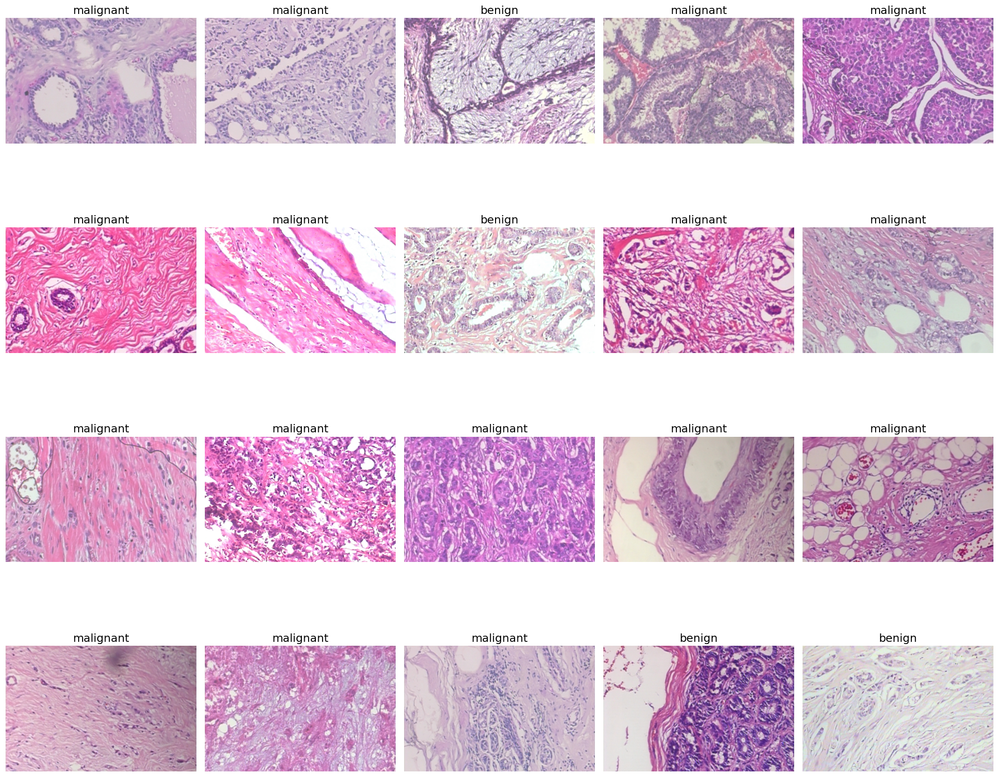

In [4]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Directory containing images
dataset_dir = 'D:/multi_class/BrreakHIS_v1_100x_Binary/dataset'

# Function to display random images from a directory
def show_random_images_from_directory(directory, num_images=10):
    # List all files in the directory
    image_files = []
    for root, _, files in os.walk(directory):
        for file in files:
            # Check if the file is an image
            if file.endswith('.png') or file.endswith('.jpg') or file.endswith('.jpeg'):
                # Construct the full path to the image
                img_path = os.path.join(root, file)
                image_files.append(img_path)
    
    # Print the list of image files found (for debugging)
    print(f"Found {len(image_files)} images in directory: {directory}")
    print("Sample of image paths:")
    for img_path in image_files[:5]:  # Print the first 5 paths as an example
        print(img_path)
    
    # Randomly select num_images images
    random_images = random.sample(image_files, min(num_images, len(image_files)))
    
    # Create subplots
    ncols = 5  # Number of columns for display
    nrows = (len(random_images) + ncols - 1) // ncols  # Calculate number of rows based on number of images
    fig, axes = plt.subplots(nrows, ncols, figsize=(18, 4 * nrows))
    
    # Iterate over selected random images and display them
    for i, img_path in enumerate(random_images):
        ax = axes.flatten()[i]
        image = Image.open(img_path)
        ax.imshow(image)
        
        # Extract class name from the image path
        class_name = os.path.basename(os.path.dirname(img_path))
        ax.set_title(class_name)  # Display the class name as the title
        ax.axis('off')
    
    # Remove empty subplots
    for j in range(len(random_images), nrows * ncols):
        axes.flatten()[j].remove()
    
    plt.tight_layout()
    plt.show()

# Display random 20 images from the dataset directory
show_random_images_from_directory(dataset_dir, num_images=20)


Classes found in dataset:
['benign', 'malignant']
Class to index mapping:
{'benign': 0, 'malignant': 1}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


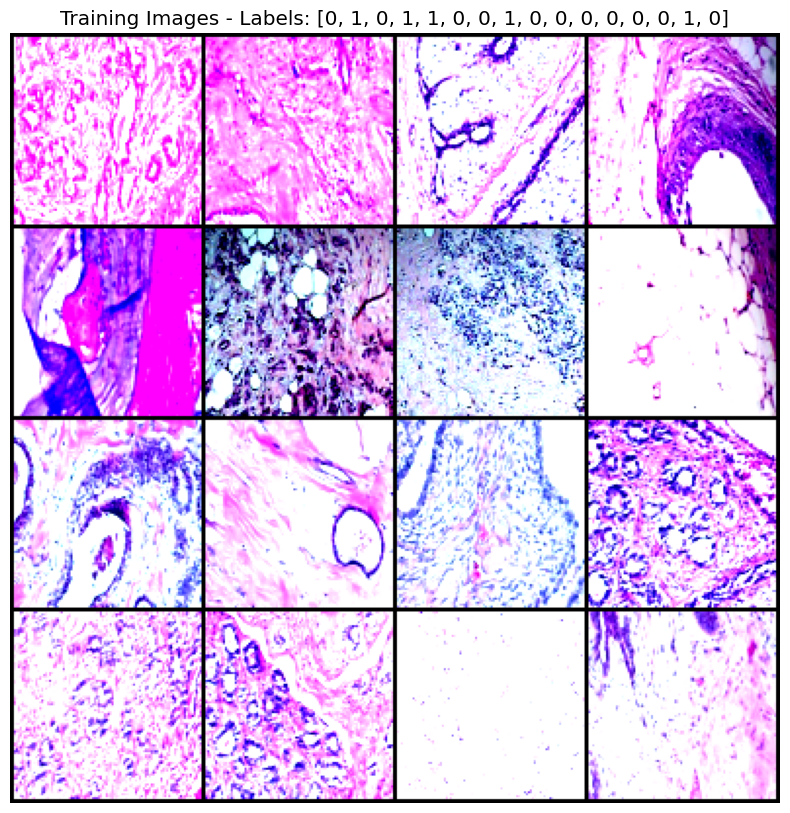

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


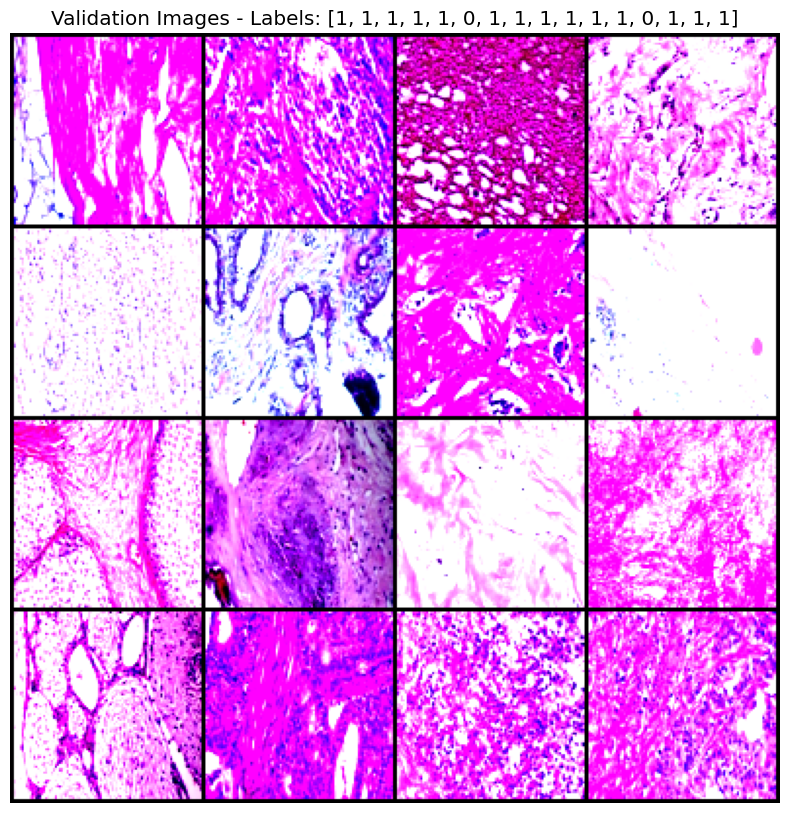

In [5]:
import torch
from torch.utils.data import Dataset, DataLoader, random_split, Sampler
from torchvision import transforms
from PIL import Image, ImageEnhance
import os
import numpy as np
import random
import cv2
import matplotlib.pyplot as plt
import torchvision.utils as vutils
from imblearn.over_sampling import RandomOverSampler

# Define custom transformations
class SpecificColorPopup:
    def __init__(self, probability=0.5, factor=2.5):
        self.probability = probability
        self.factor = factor

    def __call__(self, img):
        if random.random() < self.probability:
            img = self.enhance_specific_colors(img, self.factor)
        return img

    def enhance_specific_colors(self, img, factor):
        img_cv = np.array(img)
        img_cv = cv2.cvtColor(img_cv, cv2.COLOR_RGB2HSV)
        color_ranges = [
            ((140, 50, 50), (170, 255, 255)),  # Pink
            ((120, 50, 50), (140, 255, 255)),  # Purple
            ((100, 50, 50), (120, 255, 255)),  # Blue
            ((0, 50, 50), (10, 255, 255)),     # Red
            ((170, 50, 50), (180, 255, 255)),  # Red again
            ((80, 50, 50), (100, 255, 255))    # Greenish-blue
        ]
        for lower, upper in color_ranges:
            mask = cv2.inRange(img_cv, lower, upper)
            img_cv[mask > 0] = self.enhance_color(img_cv[mask > 0], factor)
        img_cv = cv2.cvtColor(img_cv, cv2.COLOR_HSV2RGB)
        return Image.fromarray(img_cv)

    def enhance_color(self, pixels, factor):
        pixels[:, 1] = np.clip(pixels[:, 1] * factor, 0, 255)
        return pixels

class EdgeSharpening:
    def __init__(self, factor=2.0):
        self.factor = factor

    def __call__(self, img):
        enhancer = ImageEnhance.Sharpness(img)
        img = enhancer.enhance(self.factor)
        return img

# Custom Dataset class
class CustomDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        
        # List all files in the dataset directory
        self.file_list = []
        for root, _, files in os.walk(self.data_dir):
            for file in files:
                if file.endswith('.png') or file.endswith('.jpg') or file.endswith('.jpeg'):
                    self.file_list.append(os.path.join(root, file))
        
        # Initialize an empty set to collect unique class names
        self.classes = set()
        
        # Populate self.classes
        for file_path in self.file_list:
            class_name = os.path.basename(os.path.dirname(file_path))
            self.classes.add(class_name)
        
        # Sort and convert set to list for consistency in class indexing
        self.classes = sorted(list(self.classes))
        
        # Create self.class_to_idx mapping
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        
        # Create a list of (file_path, label) tuples
        self.samples = [(file_path, self.class_to_idx[os.path.basename(os.path.dirname(file_path))]) for file_path in self.file_list]
        
        # Print class names and indices for verification
        print("Classes found in dataset:")
        print(self.classes)
        print("Class to index mapping:")
        print(self.class_to_idx)
        
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        return image, label
    

# Stratified Sampler to ensure each batch contains all classes
class StratifiedSampler(Sampler):
    def __init__(self, data_source, batch_size):
        self.data_source = data_source.dataset  # Access the original dataset
        self.batch_size = batch_size
        
        # Get the labels
        labels = np.array([label for _, label in self.data_source.samples])
        
        # Get the indices of each class
        self.class_indices = {}
        for label in np.unique(labels):
            self.class_indices[label] = np.where(labels == label)[0]
        
        # Find the minimum class count to ensure all classes are represented evenly
        self.min_class_count = min([len(indices) for indices in self.class_indices.values()])
        
        # Calculate number of batches per epoch, ensure num_batches > 0
        self.num_batches = max(1, self.min_class_count // (batch_size // len(self.class_indices)))
    
    def __iter__(self):
        batch = []
        for _ in range(self.num_batches):
            batch_indices = []
            for class_indices in self.class_indices.values():
                # Ensure we don't exceed available indices
                class_samples = np.random.choice(class_indices, min(self.batch_size // len(self.class_indices), len(class_indices)), replace=False)
                batch_indices.extend(class_samples)
            np.random.shuffle(batch_indices)
            batch.append(batch_indices)
        return iter(np.concatenate(batch))
    
    def __len__(self):
        return self.num_batches * self.batch_size

# Define data directory and transformations
data_dir = 'D:\\multi_class\\BrreakHIS_v1_100x_Binary\\dataset'

# Define transformations for training set with augmentations
train_transform = transforms.Compose([
    SpecificColorPopup(probability=0.3, factor=1.8),
    EdgeSharpening(factor=1.5),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), shear=5),
    transforms.RandomPerspective(distortion_scale=0.1, p=0.2),
    transforms.ColorJitter(brightness=0.1, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.Resize((96, 96)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Define transformations for validation set without augmentation
val_transform = transforms.Compose([
    transforms.Resize((96, 96)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create CustomDataset instances
dataset = CustomDataset(data_dir, transform=None)  # No transform initially for splitting

# Split dataset into training and validation sets
train_size = int(0.7 * len(dataset))  # 70% for training
val_size = len(dataset) - train_size  # 30% for validation
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# Update transform for train and validation datasets
train_dataset.dataset.transform = train_transform
val_dataset.dataset.transform = val_transform

# Apply RandomOverSampler to balance the training dataset
file_paths, labels = zip(*train_dataset.dataset.samples)
ros = RandomOverSampler(random_state=42)
resampled_file_paths, resampled_labels = ros.fit_resample(np.array(file_paths).reshape(-1, 1), labels)

# Create a new list of (file_path, label) tuples with the resampled data
resampled_samples = [(file_path[0], label) for file_path, label in zip(resampled_file_paths, resampled_labels)]

# Replace the original dataset samples with the resampled ones for training dataset
train_dataset.dataset.samples = resampled_samples

# Update the length of the training dataset
train_dataset.indices = list(range(len(train_dataset.dataset.samples)))

# Define batch size
batch_size = 32

# Instantiate the stratified sampler for the training dataset
stratified_sampler = StratifiedSampler(train_dataset, batch_size=batch_size)

# Create DataLoader instances for training and validation
train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=stratified_sampler)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)  # No need to shuffle for validation

# Function to visualize images with labels
def visualize_images_with_labels(dataloader, dataset, title, num_images_to_show=16):
    images, labels = next(iter(dataloader))
    images = images[:num_images_to_show]
    labels = labels[:num_images_to_show]
    grid = vutils.make_grid(images, nrow=4)
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
    plt.title(f'{title} - Labels: {labels.tolist()}')
    plt.axis('off')
    plt.show()

# Visualize some training images with labels
visualize_images_with_labels(train_loader, dataset, title='Training Images')

# Visualize some validation images with labels
visualize_images_with_labels(val_loader, dataset, title='Validation Images')


In [6]:
import math

# Assuming you have already defined your train_dataset and val_dataset
# Get the number of samples in the training and validation datasets
num_train_samples = len(train_dataset)
num_val_samples = len(val_dataset)

# Define your batch size
batch_size = 32

# Calculate the number of batches
num_train_batches = math.ceil(num_train_samples / batch_size)
num_val_batches = math.ceil(num_val_samples / batch_size)

print(f'Number of training samples: {num_train_samples}')
print(f'Number of validation samples: {num_val_samples}')
print(f'Number of training batches: {num_train_batches}')
print(f'Number of validation batches: {num_val_batches}')


Number of training samples: 2874
Number of validation samples: 605
Number of training batches: 90
Number of validation batches: 19


In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset
from torchvision import models
import torch.nn.functional as F
import numpy as np

# Squeeze-and-Excitation Block
class SEBlock(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SEBlock, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

# Self-Attention Block
class SelfAttention(nn.Module):
    def __init__(self, in_dim):
        super(SelfAttention, self).__init__()
        self.chanel_in = in_dim
        self.query_conv = nn.Conv2d(in_channels=in_dim, out_channels=in_dim // 8, kernel_size=1)
        self.key_conv = nn.Conv2d(in_channels=in_dim, out_channels=in_dim // 8, kernel_size=1)
        self.value_conv = nn.Conv2d(in_channels=in_dim, out_channels=in_dim, kernel_size=1)
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x):
        m_batchsize, C, width, height = x.size()
        proj_query = self.query_conv(x).view(m_batchsize, -1, width * height).permute(0, 2, 1)
        proj_key = self.key_conv(x).view(m_batchsize, -1, width * height)
        energy = torch.bmm(proj_query, proj_key)
        attention = self.softmax(energy)
        proj_value = self.value_conv(x).view(m_batchsize, -1, width * height)

        out = torch.bmm(proj_value, attention.permute(0, 2, 1))
        out = out.view(m_batchsize, C, width, height)

        out = self.gamma * out + x
        return out

# Custom CNN with Attention and SE Blocks
class CustomCNNWithAttention(nn.Module):
    def __init__(self, num_classes):
        super(CustomCNNWithAttention, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),  # Layer 1
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),  # Layer 2
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # Layer 3

            nn.Conv2d(64, 128, kernel_size=3, padding=1),  # Layer 4
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),  # Layer 5
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # Layer 6

            nn.Conv2d(128, 256, kernel_size=3, padding=1),  # Layer 7
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),  # Layer 8
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # Layer 9

            nn.Conv2d(256, 512, kernel_size=3, padding=1),  # Layer 10
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),  # Layer 11
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # Layer 12

            nn.Conv2d(512, 512, kernel_size=3, padding=1),  # Layer 13
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),  # Layer 14
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # Layer 15
        )

        # Adding SE Block and Self-Attention Block
        self.se_block = SEBlock(512)
        self.attention_block = SelfAttention(512)

        # Adaptive Average Pooling before flattening
        self.adaptive_pool = nn.AdaptiveAvgPool2d((1, 1))

        # Classifier with extra depth and increased dropout for regularization
        self.classifier = nn.Sequential(
            nn.Linear(512, 1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),  # Increased dropout for better regularization
            nn.Linear(1024, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.features(x)  # Output size: (batch_size, 512, 7, 7)
        x = self.se_block(x)
        x = self.attention_block(x)
        x = self.adaptive_pool(x)  # Output size: (batch_size, 512, 1, 1)
        x = x.view(x.size(0), -1)  # Flatten the tensor before feeding into classifier
        x = self.classifier(x)
        return x

# Assuming you have your dataset loaded here as `train_dataset`
num_classes = len(np.unique([label for _, label in train_dataset]))  # Determine number of unique classes
model = CustomCNNWithAttention(num_classes)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Custom weight initialization
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight)
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)

model.apply(weights_init)

# Define the optimizer with weight decay for regularization
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-4)

# Define loss function (consider class weights if dataset is imbalanced)
# Calculate class weights if necessary
class_counts = np.bincount([label for _, label in train_dataset])
class_weights = torch.tensor([1.0 / count for count in class_counts], dtype=torch.float32).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

# Example usage with a sample input
sample_input = torch.randn(1, 3, 224, 224).to(device)
output = model(sample_input)
print("Output shape:", output.shape)
print("Output probabilities:", F.softmax(output, dim=1))



Output shape: torch.Size([1, 2])
Output probabilities: tensor([[0.4078, 0.5922]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


In [8]:
import torch
import torch.nn.functional as F

probabilities = F.softmax(output, dim=1)
print(probabilities)


tensor([[0.4078, 0.5922]], device='cuda:0', grad_fn=<SoftmaxBackward0>)


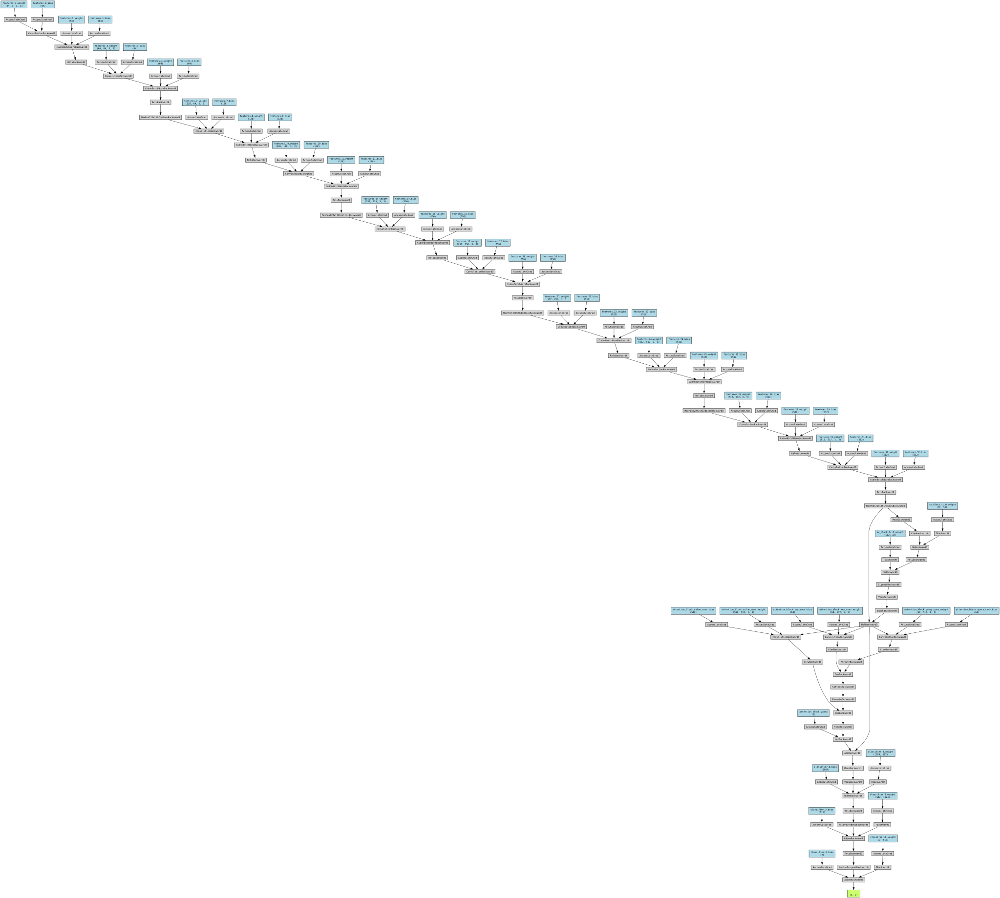

In [9]:
from torchviz import make_dot

# Example input tensor (same shape as your input data)
x = torch.randn(1, 3, 224, 224).to(device)

# Perform a forward pass through the model
output = model(x)

# Create a graph of the model
model_graph = make_dot(output, params=dict(model.named_parameters()))

# Render the model graph
model_graph.render("model_architecture", format="png")  # Saves as a .png file
model_graph


In [10]:
import torch

# Check if CUDA is available
train_on_gpu = torch.cuda.is_available()

# Print the result
if train_on_gpu:
    print('CUDA is available! Training on GPU...')
else:
    print('CUDA is not available. Training on CPU...')

CUDA is available! Training on GPU...


In [11]:
# Inside your model creation code, after defining your model
if train_on_gpu:
    model.cuda()

In [12]:
# Trainable Parameters
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Number of trainable parameters: \n{}".format(pytorch_total_params))

Number of trainable parameters: 
10823107


In [13]:
# Print the model summary
from torchsummary import summary
summary(model, input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
            Conv2d-4         [-1, 64, 224, 224]          36,928
       BatchNorm2d-5         [-1, 64, 224, 224]             128
              ReLU-6         [-1, 64, 224, 224]               0
         MaxPool2d-7         [-1, 64, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]          73,856
       BatchNorm2d-9        [-1, 128, 112, 112]             256
             ReLU-10        [-1, 128, 112, 112]               0
           Conv2d-11        [-1, 128, 112, 112]         147,584
      BatchNorm2d-12        [-1, 128, 112, 112]             256
             ReLU-13        [-1, 128, 112, 112]               0
        MaxPool2d-14          [-1, 128,

In [14]:
# check if CUDA is available
train_on_gpu = torch.cuda.is_available()

if train_on_gpu:
    device = torch.device("cuda")          # CUDA device object
    print(f"CUDA is available! Using GPU: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device("cpu")           # CPU device object
    print("CUDA is not available. Using CPU instead.")

CUDA is available! Using GPU: NVIDIA GeForce GTX 1660 SUPER


In [15]:
# Inside your model creation code, after defining your model
if train_on_gpu:
    model.cuda()

In [16]:
# Loss function and optimizer
from torch.optim.lr_scheduler import ReduceLROnPlateau


criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
scheduler = ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5, verbose=True)

In [17]:
import torch
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, confusion_matrix, f1_score
from sklearn.preprocessing import OneHotEncoder
import random
import os

# Initialize OneHotEncoder with updated parameter
onehot_encoder = OneHotEncoder(sparse_output=False)

# Check if CUDA is available
train_on_gpu = torch.cuda.is_available()

# Initialize model, criterion, optimizer, scheduler
# Assuming model, criterion, optimizer, scheduler are already defined

# Training loop with evaluation metrics
n_epochs = 100
valid_loss_min = np.Inf


# Keeping track of losses and accuracies
train_losses = []
valid_losses = []
train_accuracies = []
valid_accuracies = []
auc_epoch = []
f1_epoch = []  # To store F1-scores per epoch

# Function to save checkpoints
def save_checkpoint(state, is_best, checkpoint_path='checkpoint.pth'):
    torch.save(state, checkpoint_path)
    if is_best:
        torch.save(state, 'best_model.pth')
        
# Function to load checkpoint
def load_checkpoint(checkpoint_path, model, optimizer):
    if os.path.exists(checkpoint_path):
        checkpoint = torch.load(checkpoint_path)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        epoch = checkpoint['epoch']
        valid_loss_min = checkpoint['valid_loss_min']
        train_losses = checkpoint['train_losses']
        valid_losses = checkpoint['valid_losses']
        train_accuracies = checkpoint['train_accuracies']
        valid_accuracies = checkpoint['valid_accuracies']
        auc_epoch = checkpoint['auc_epoch']
        f1_epoch = checkpoint['f1_epoch']
        
        print(f"Checkpoint loaded, resuming from epoch {epoch+1}")
        return epoch, valid_loss_min, train_losses, valid_losses, train_accuracies, valid_accuracies, auc_epoch, f1_epoch
    else:
        print("No checkpoint found, starting from scratch.")
        return 0, np.Inf, [], [], [], [], [], []

# Load checkpoint if available
start_epoch, valid_loss_min, train_losses, valid_losses, train_accuracies, valid_accuracies, auc_epoch, f1_epoch = load_checkpoint('checkpoint.pth', model, optimizer)

for epoch in range(start_epoch + 1, n_epochs + 1):
    # Keep track of training and validation loss and accuracy
    train_loss = 0.0
    valid_loss = 0.0
    train_correct = 0
    train_total = 0
    val_correct = 0
    val_total = 0
    val_auc_epoch = []
    val_f1_epoch = []  # To store F1 scores
    val_precision_epoch = []
    val_recall_epoch = []
    val_specificity_epoch = []

    ###################
    # train the model #
    ###################
    model.train()
    for images, target in train_loader:
        # Move tensors to GPU if CUDA is available
        if train_on_gpu:
            images, target = images.cuda(), target.cuda()
        
        target = target.long()
        # Clear the gradients of all optimized variables
        optimizer.zero_grad()
        # Forward pass: compute predicted outputs by passing inputs to the model
        output = model(images)
        # Calculate the batch loss
        loss = criterion(output, target)
        # Backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # Perform a single optimization step (parameter update)
        optimizer.step()
        # Update Train loss
        train_loss += loss.item() * images.size(0)
        
        # Calculate accuracy
        _, preds = torch.max(output, 1)
        train_correct += (preds == target).sum().item()
        train_total += target.size(0)
    
    ######################
    # validate the model #
    ######################
    model.eval()
    for images, target in val_loader:
        # Move tensors to GPU if CUDA is available
        if train_on_gpu:
            images, target = images.cuda(), target.cuda()
        
        target = target.long()
        # Forward pass: compute predicted outputs by passing inputs to the model
        output = model(images)
        # Calculate the batch loss
        loss = criterion(output, target)
        # Update average validation loss 
        valid_loss += loss.item() * images.size(0)
        
        # Calculate accuracy
        _, preds = torch.max(output, 1)
        val_correct += (preds == target).sum().item()
        val_total += target.size(0)
        
        # Convert output to probabilities using softmax
        probs = F.softmax(output, dim=1).cpu().detach().numpy()
        # Convert target to numpy array
        y_true = target.cpu().numpy().reshape(-1, 1)
        y_true_onehot = onehot_encoder.fit_transform(y_true)
        # Calculate ROC AUC for multiclass classification
        if y_true_onehot.shape[1] == probs.shape[1]:
            val_auc_epoch.append(roc_auc_score(y_true_onehot, probs, multi_class='ovr'))
        
        # Calculate precision, recall, F1-score, and specificity
        val_precision_epoch.append(precision_score(y_true, preds.cpu().numpy(), average='macro', zero_division=0))
        val_recall_epoch.append(recall_score(y_true, preds.cpu().numpy(), average='macro', zero_division=0))
        val_f1_epoch.append(f1_score(y_true, preds.cpu().numpy(), average='macro', zero_division=0))  # F1-score
        
        cm = confusion_matrix(y_true, preds.cpu().numpy())
        tn = np.diag(cm)
        fp = cm.sum(axis=0) - tn
        fn = cm.sum(axis=1) - tn
        specificity = np.divide(tn, tn + fp, out=np.zeros_like(tn, dtype=float), where=(tn + fp) != 0)
        val_specificity_epoch.append(np.mean(specificity))

    # Calculate average losses and metrics
    train_loss = train_loss / len(train_loader.dataset)
    valid_loss = (valid_loss / len(val_loader.dataset))
    train_accuracy = train_correct / train_total
    valid_accuracy = (val_correct / val_total)
    valid_auc = np.mean(val_auc_epoch)
    valid_precision = np.mean(val_precision_epoch)
    valid_recall = np.mean(val_recall_epoch)
    valid_specificity = np.mean(val_specificity_epoch)
    valid_f1 = np.mean(val_f1_epoch)  # F1-score for current epoch
    
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)
    train_accuracies.append(train_accuracy)
    valid_accuracies.append(valid_accuracy)
    auc_epoch.append(valid_auc)
    f1_epoch.append(valid_f1)  # Save F1-score for current epoch
        
    # Print training/validation statistics 
    print(f'Epoch: {epoch} | Training Loss: {train_loss:.6f} | Validation Loss: {valid_loss:.6f} | Training Accuracy: {train_accuracy:.4f} | Validation Accuracy: {valid_accuracy:.4f} | Validation AUC: {valid_auc:.4f} | Precision: {valid_precision:.4f} | Sensitivity: {valid_recall:.4f} | Specificity: {valid_specificity:.4f} | F1-Score: {valid_f1:.4f}')

    ##################
    # Early Stopping #
    ##################
    # Step the scheduler based on validation loss
    scheduler.step(valid_loss)
    # Get the new learning rate
    new_lr = optimizer.param_groups[0]['lr']
    print(f'Learning Rate adjusted to: {new_lr}')
    
    # Check if validation loss decreased, save model and checkpoint if yes
    is_best = valid_loss <= valid_loss_min
    if is_best:
        print(f'Validation loss decreased ({valid_loss_min:.6f} --> {valid_loss:.6f}). Saving model and checkpoint...')
        valid_loss_min = valid_loss
        epochs_no_improve = 0  # Reset the counter for early stopping
    else:
        epochs_no_improve += 1  # Increment the counter
    
    # Save checkpoint after each epoch
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'valid_loss_min': valid_loss_min,
        'train_losses': train_losses,
        'valid_losses': valid_losses,
        'train_accuracies': train_accuracies,
        'valid_accuracies': valid_accuracies,
        'auc_epoch': auc_epoch,
        'f1_epoch': f1_epoch  # Save F1-score history
    }
    save_checkpoint(checkpoint, is_best)
    

No checkpoint found, starting from scratch.
Epoch: 1 | Training Loss: 0.399173 | Validation Loss: 0.299097 | Training Accuracy: 0.8199 | Validation Accuracy: 0.8777 | Validation AUC: 0.9552 | Precision: 0.8418 | Sensitivity: 0.8893 | Specificity: 0.8418 | F1-Score: 0.8513
Learning Rate adjusted to: 0.0001
Validation loss decreased (inf --> 0.299097). Saving model and checkpoint...
Epoch: 2 | Training Loss: 0.279594 | Validation Loss: 0.434612 | Training Accuracy: 0.8852 | Validation Accuracy: 0.8000 | Validation AUC: 0.9649 | Precision: 0.7842 | Sensitivity: 0.8590 | Specificity: 0.7842 | F1-Score: 0.7792
Learning Rate adjusted to: 0.0001
Epoch: 3 | Training Loss: 0.191744 | Validation Loss: 0.104851 | Training Accuracy: 0.9206 | Validation Accuracy: 0.9488 | Validation AUC: 0.9925 | Precision: 0.9428 | Sensitivity: 0.9267 | Specificity: 0.9428 | F1-Score: 0.9303
Learning Rate adjusted to: 0.0001
Validation loss decreased (0.299097 --> 0.104851). Saving model and checkpoint...
Epoch: 4

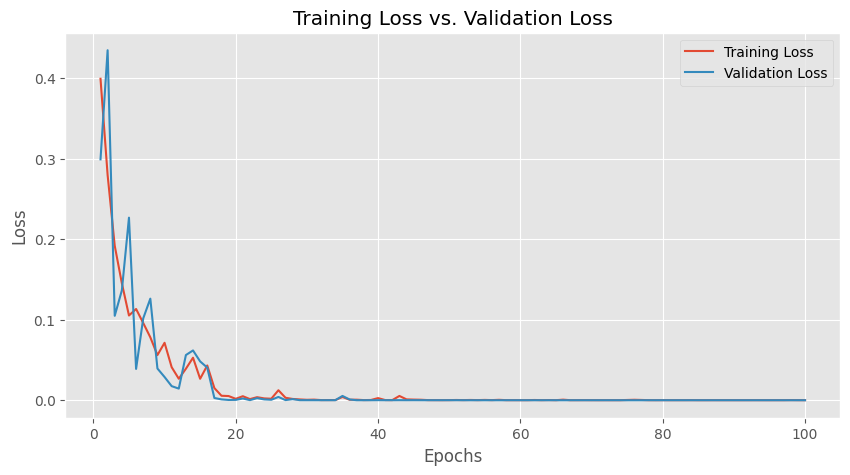

In [18]:
# Plotting the losses
plt.figure(figsize=(10, 5))
plt.plot(range(1, n_epochs + 1), train_losses, label='Training Loss')
plt.plot(range(1, n_epochs + 1), valid_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss vs. Validation Loss') 
plt.legend()
plt.show()

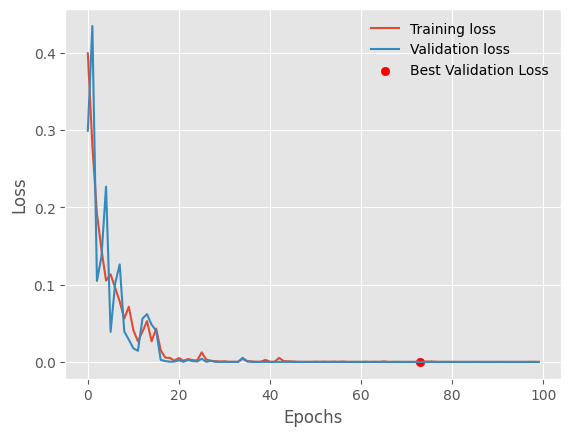

In [19]:
import matplotlib.pyplot as plt

# Assuming 'train_losses' and 'valid_losses' are lists containing training and validation losses for each epoch
# 'best_epoch' is the epoch at which the best validation loss occurred

plt.plot(train_losses, label='Training loss')
plt.plot(valid_losses, label='Validation loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")

# Find the epoch with the minimum validation loss
best_epoch = valid_losses.index(min(valid_losses))

# Plot a marker for the best result
plt.scatter(best_epoch, valid_losses[best_epoch], color='red', label='Best Validation Loss')

plt.legend(frameon=False)
plt.show()


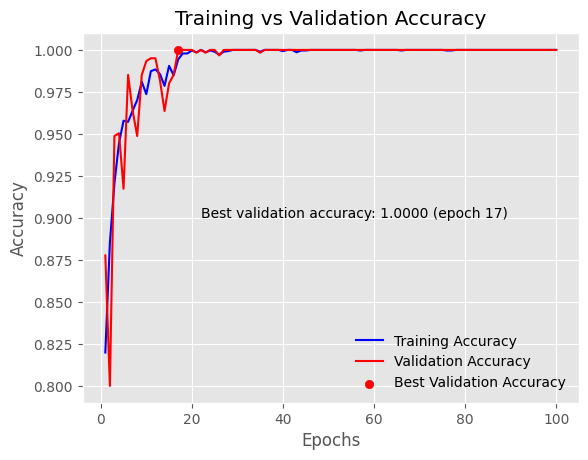

In [29]:
import matplotlib.pyplot as plt

# Number of epochs
epochs = range(1, n_epochs + 1)

# Plotting the data
plt.plot(epochs, train_accuracies, 'b', label='Training Accuracy')
plt.plot(epochs, valid_accuracies, 'r', label='Validation Accuracy')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Find the epoch with the best validation accuracy
best_epoch = valid_accuracies.index(max(valid_accuracies)) + 1
best_accuracy = max(valid_accuracies)

# Annotate the plot with the best validation accuracy
plt.scatter(best_epoch, best_accuracy, color='red', label='Best Validation Accuracy')
plt.annotate(f'Best validation accuracy: {best_accuracy:.4f} (epoch {best_epoch})',
             xy=(best_epoch, best_accuracy),
             xytext=(best_epoch + 5, best_accuracy - 0.1)) # Adjust xytext here

plt.legend(frameon=False)

# Display the plot
plt.show()


In [21]:
best_valid_accuracy_percentage = max(valid_accuracies) * 100
print("Best validation accuracy:", best_valid_accuracy_percentage, "%")


Best validation accuracy: 100.0 %


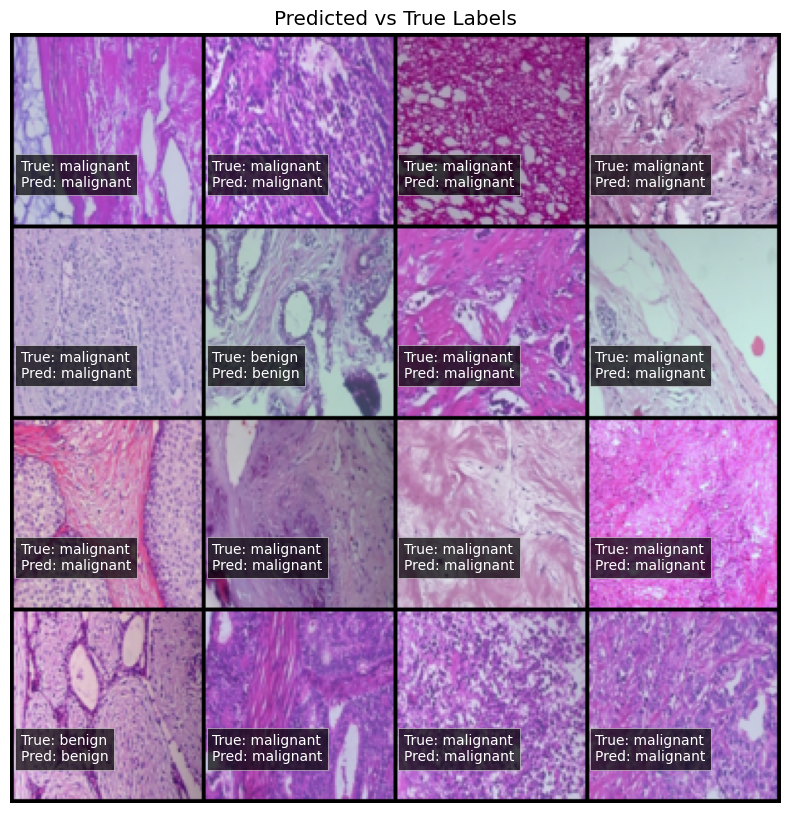

In [22]:
import torch.nn.functional as F

# Function to visualize images with predicted and true labels
def visualize_predictions(dataloader, dataset, model, num_images_to_show=16):
    model.eval()  # Set the model to evaluation mode
    images, true_labels = next(iter(dataloader))
    images = images[:num_images_to_show]
    true_labels = true_labels[:num_images_to_show]

    if train_on_gpu:
        images = images.cuda()

    with torch.no_grad():
        outputs = model(images)
    
    _, predicted_labels = torch.max(outputs, 1)
    images = images.cpu()  # Move images back to CPU for visualization
    
    # Create a grid of images
    grid = vutils.make_grid(images, nrow=4, padding=2, normalize=True)
    grid_np = np.transpose(grid.numpy(), (1, 2, 0))
    
    # Plot the images
    plt.figure(figsize=(20, 10))
    plt.imshow(grid_np)
    plt.title('Predicted vs True Labels')
    plt.axis('off')

    num_images = images.size(0)
    for i in range(num_images):
        true_label_idx = true_labels[i].item()
        predicted_label_idx = predicted_labels[i].item()
        true_label_name = dataset.dataset.classes[true_label_idx]  # Access classes from original dataset
        predicted_label_name = dataset.dataset.classes[predicted_label_idx]
        
        row = i // 4
        col = i % 4
        x = col * (grid_np.shape[1] // 4) + 5
        y = (row + 1) * (grid_np.shape[0] // (num_images // 4)) - 20
        
        plt.text(x, y, f'True: {true_label_name}\nPred: {predicted_label_name}', fontsize=10, color='white', bbox=dict(facecolor='black', alpha=0.7))
    
    plt.show()

# Example usage: Visualize predictions on validation dataset
visualize_predictions(val_loader, val_dataset, model)


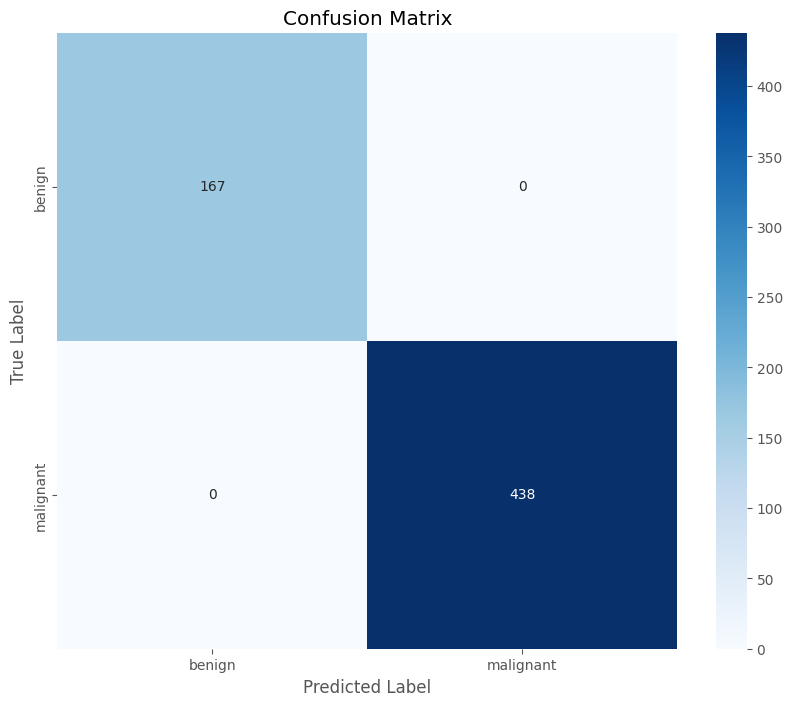

In [23]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Function to compute and visualize the confusion matrix
def plot_confusion_matrix(dataloader, model, classes):
    model.eval()  # Set the model to evaluation mode
    
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for images, labels in dataloader:
            if train_on_gpu:
                images, labels = images.cuda(), labels.cuda()
            
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    # Compute confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    
    # Plot confusion matrix using seaborn
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

# Example usage: Plot confusion matrix for validation dataset
plot_confusion_matrix(val_loader, model, classes=val_dataset.dataset.classes)


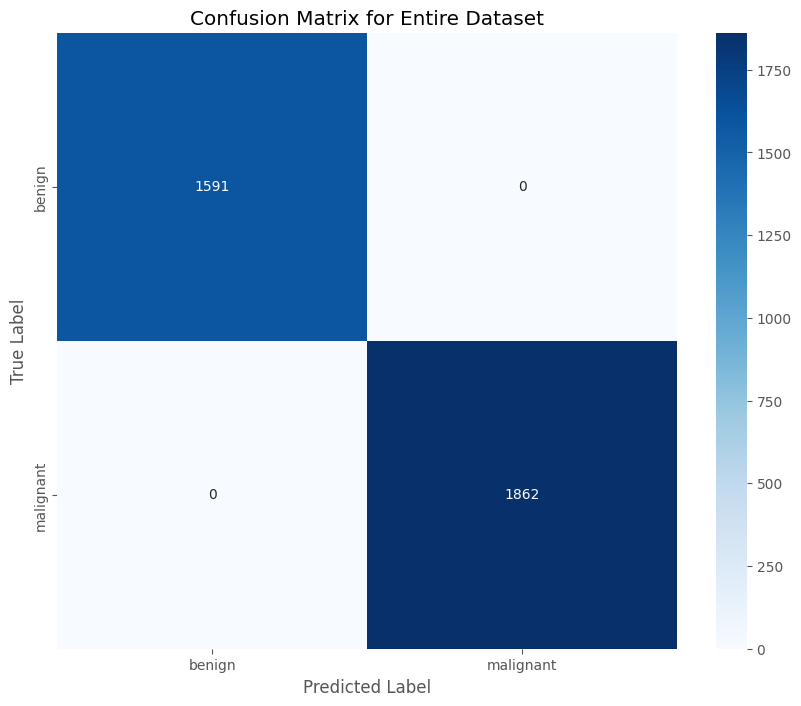

In [24]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Function to compute and visualize the confusion matrix for the entire dataset
def plot_confusion_matrix_for_entire_dataset(train_loader, val_loader, model, classes):
    model.eval()  # Set the model to evaluation mode
    
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        # Iterate over the training dataset
        for images, labels in train_loader:
            if train_on_gpu:
                images, labels = images.cuda(), labels.cuda()
            
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
        
        # Iterate over the validation dataset
        for images, labels in val_loader:
            if train_on_gpu:
                images, labels = images.cuda(), labels.cuda()
            
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    # Compute confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    
    # Plot confusion matrix using seaborn
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix for Entire Dataset')
    plt.show()

# Example usage: Plot confusion matrix for the entire dataset
plot_confusion_matrix_for_entire_dataset(train_loader, val_loader, model, classes=val_dataset.dataset.classes)


Number of misclassified images: 0
Number of correctly classified images: 3453


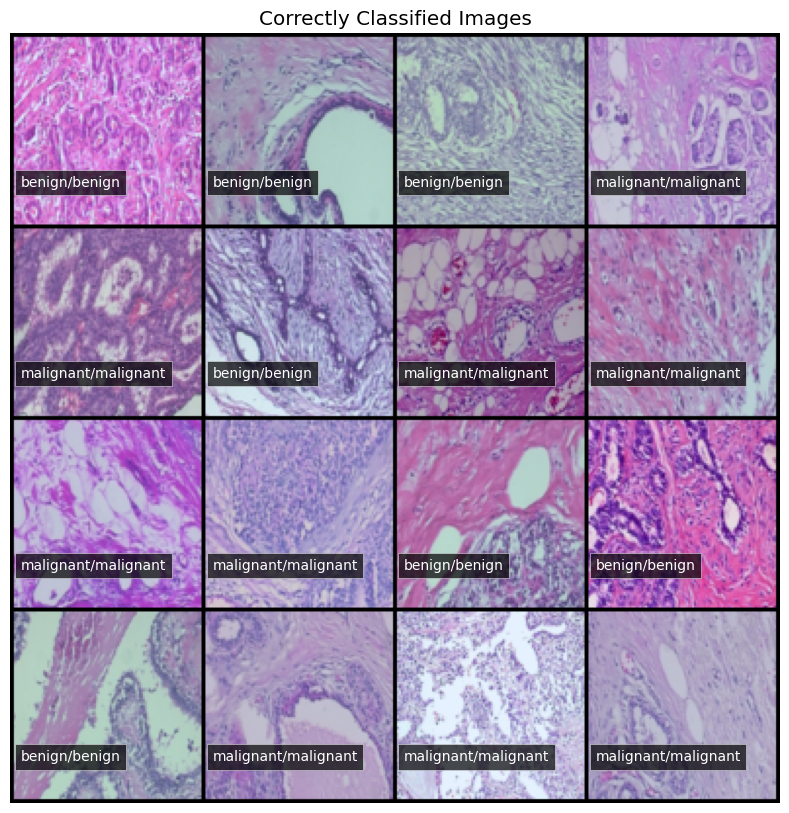

In [25]:
import torch
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt

# Function to collect predictions and labels
def collect_predictions_and_labels(dataloader, model):
    model.eval()  # Set model to evaluation mode
    images_list = []
    preds_list = []
    labels_list = []
    
    with torch.no_grad():
        for images, labels in dataloader:
            if train_on_gpu:
                images, labels = images.cuda(), labels.cuda()
            
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            
            images_list.extend(images.cpu())
            preds_list.extend(preds.cpu().numpy())
            labels_list.extend(labels.cpu().numpy())
    
    return images_list, preds_list, labels_list

# Function to visualize images
def visualize_images(images, preds, labels, classes, title):
    fig = plt.figure(figsize=(15, 10))
    grid = vutils.make_grid(images, nrow=4, padding=2, normalize=True)
    plt.imshow(np.transpose(grid, (1, 2, 0)))
    plt.title(title)
    plt.axis('off')
    
    for i in range(len(images)):
        label_name = classes[labels[i]]
        pred_name = classes[preds[i]]
        row = i // 4
        col = i % 4
        x = col * (grid.shape[2] // 4) + 5
        y = (row + 1) * (grid.shape[1] // (len(images) // 4)) - 20
        plt.text(x, y, f'{label_name}/{pred_name}', fontsize=10, color='white', bbox=dict(facecolor='black', alpha=0.7))
    
    plt.show()

# Collect predictions and labels for both train and validation loaders
train_images, train_preds, train_labels = collect_predictions_and_labels(train_loader, model)
val_images, val_preds, val_labels = collect_predictions_and_labels(val_loader, model)

# Combine train and validation data
all_images = train_images + val_images
all_preds = train_preds + val_preds
all_labels = train_labels + val_labels

# Identify misclassified and correctly classified images
misclassified_images = []
misclassified_preds = []
misclassified_labels = []
correctly_classified_images = []
correctly_classified_preds = []
correctly_classified_labels = []

for img, pred, label in zip(all_images, all_preds, all_labels):
    if pred == label:
        correctly_classified_images.append(img)
        correctly_classified_preds.append(pred)
        correctly_classified_labels.append(label)
    else:
        misclassified_images.append(img)
        misclassified_preds.append(pred)
        misclassified_labels.append(label)

# Define the classes
classes = val_dataset.dataset.classes

# Print the number of misclassified and correctly classified images
print(f'Number of misclassified images: {len(misclassified_images)}')
print(f'Number of correctly classified images: {len(correctly_classified_images)}')

# Visualize misclassified images
if misclassified_images:
    misclassified_images = misclassified_images[:16]  # Show only first 16 misclassified images
    visualize_images(misclassified_images, misclassified_preds[:16], misclassified_labels[:16], classes, title='Misclassified Images')

# Visualize correctly classified images
if correctly_classified_images:
    correctly_classified_images = correctly_classified_images[:16]  # Show only first 16 correctly classified images
    visualize_images(correctly_classified_images, correctly_classified_preds[:16], correctly_classified_labels[:16], classes, title='Correctly Classified Images')


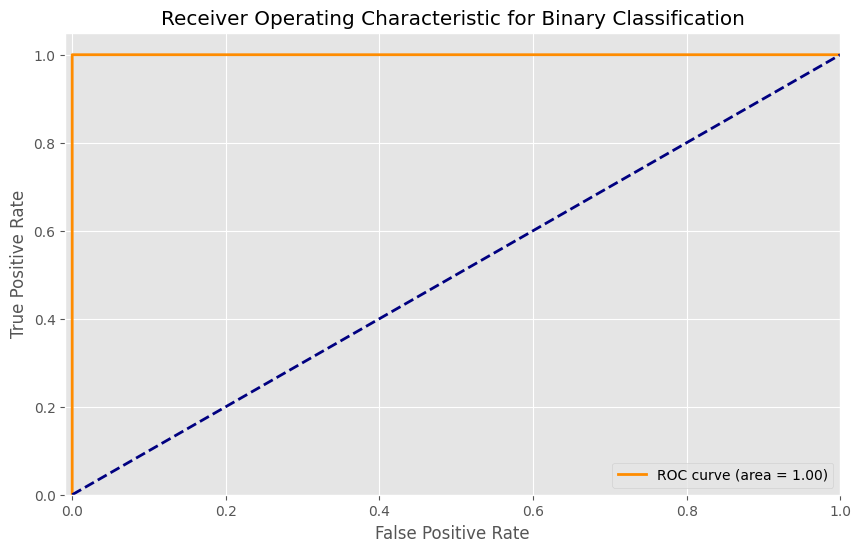

In [26]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import numpy as np
import torch

# Function to collect predictions and labels
def collect_predictions_and_labels(dataloader, model):
    model.eval()  # Set model to evaluation mode
    all_outputs = []
    all_labels = []
    
    with torch.no_grad():
        for images, labels in dataloader:
            if train_on_gpu:
                images, labels = images.cuda(), labels.cuda()
            
            outputs = model(images)
            all_outputs.append(outputs.cpu().numpy())
            all_labels.append(labels.cpu().numpy())
    
    all_outputs = np.concatenate(all_outputs, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    return all_outputs, all_labels

# Collect predictions and labels for both train and validation loaders
train_outputs, train_labels = collect_predictions_and_labels(train_loader, model)
val_outputs, val_labels = collect_predictions_and_labels(val_loader, model)

# Combine train and validation data
all_outputs = np.vstack((train_outputs, val_outputs))
all_labels = np.hstack((train_labels, val_labels))

# For binary classification, we only need the probabilities for the positive class (class 1)
# Assuming `all_outputs` contains logits or probabilities for both classes, we take the second column
all_outputs = 1 / (1 + np.exp(-all_outputs))  # Apply sigmoid if not done already
all_outputs = all_outputs[:, 1]  # Extract probabilities for class 1

# Compute ROC curve and ROC area for the positive class (class 1)
fpr, tpr, _ = roc_curve(all_labels, all_outputs)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {0:0.2f})'.format(roc_auc))

plt.plot([0, 1], [0, 1], color='navy', linestyle='--', lw=2)
plt.xlim([-0.009, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Binary Classification')
plt.legend(loc="lower right")
plt.show()


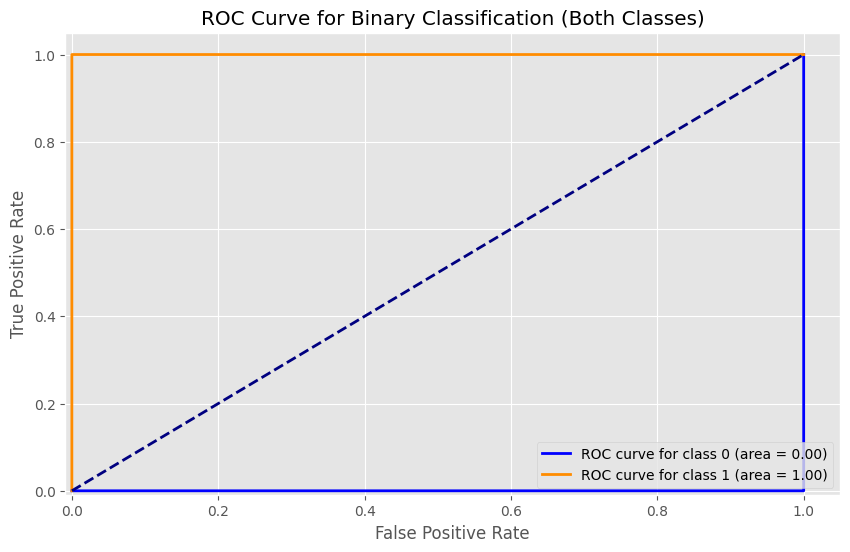

In [27]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import numpy as np
import torch

# Function to collect predictions and labels
def collect_predictions_and_labels(dataloader, model):
    model.eval()  # Set model to evaluation mode
    all_outputs = []
    all_labels = []
    
    with torch.no_grad():
        for images, labels in dataloader:
            if train_on_gpu:
                images, labels = images.cuda(), labels.cuda()
            
            outputs = model(images)
            all_outputs.append(outputs.cpu().numpy())
            all_labels.append(labels.cpu().numpy())
    
    all_outputs = np.concatenate(all_outputs, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    return all_outputs, all_labels

# Collect predictions and labels for both train and validation loaders
train_outputs, train_labels = collect_predictions_and_labels(train_loader, model)
val_outputs, val_labels = collect_predictions_and_labels(val_loader, model)

# Combine train and validation data
all_outputs = np.vstack((train_outputs, val_outputs))
all_labels = np.hstack((train_labels, val_labels))

# Apply sigmoid if the model outputs logits
all_outputs = 1 / (1 + np.exp(-all_outputs))

# Compute ROC curve and ROC area for class 0 and class 1
fpr = dict()
tpr = dict()
roc_auc = dict()

# For class 0
fpr[0], tpr[0], _ = roc_curve(all_labels, all_outputs[:, 0])
roc_auc[0] = auc(fpr[0], tpr[0])

# For class 1
fpr[1], tpr[1], _ = roc_curve(all_labels, all_outputs[:, 1])
roc_auc[1] = auc(fpr[1], tpr[1])

# Plot ROC curves for both classes
plt.figure(figsize=(10, 6))
plt.plot(fpr[0], tpr[0], color='blue', lw=2, label='ROC curve for class 0 (area = {0:0.2f})'.format(roc_auc[0]))
plt.plot(fpr[1], tpr[1], color='darkorange', lw=2, label='ROC curve for class 1 (area = {0:0.2f})'.format(roc_auc[1]))

plt.plot([0, 1], [0, 1], color='navy', linestyle='--', lw=2)
plt.xlim([-0.009, 1.05])
plt.ylim([-0.009, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Binary Classification (Both Classes)')
plt.legend(loc="lower right")
plt.show()
